In [1]:
import sys
#import pyximport
#pyximport.install()
import numpy as np
from PIL import Image
sys.path.append('.')
import matplotlib.pyplot as plt
import os
import math
import tqdm
import torch
from PIL import Image, ImageDraw
from torch import optim
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

from data.aug.compose import Compose
from data.aug import ops
from data.dataset import DOTA

from model.rdd import RDD
from model.backbone import resnet

from utils.adjust_lr import adjust_lr_multi_step
from utils.parallel import convert_model, CustomDetDataParallel

In [2]:
torch.manual_seed(0)
torch.backends.cudnn.benchmark = True

device_ids = [0, 1]
torch.cuda.set_device(device_ids[0])
backbone = resnet.resnet101

dir_dataset = '/home/mde/python/pytorch-rotation-decoupled-detector/'
dir_save = '/home/mde/python/pytorch-rotation-decoupled-detector/save/'

In [3]:
dir_weight = os.path.join(dir_save, 'weight')
dir_log = os.path.join(dir_save, 'log')
os.makedirs(dir_weight, exist_ok=True)
writer = SummaryWriter(dir_log)

indexes = [int(os.path.splitext(path)[0]) for path in os.listdir(dir_weight)]
current_step = max(indexes) if indexes else 0

print(current_step)
image_size = 768
lr = 1e-4
batch_size = 16
num_workers = 1

max_step = 250000
lr_cfg = [[100000, lr], [200000, lr / 10], [max_step, lr / 50]]
warm_up = [1000, lr / 50, lr]
save_interval = 50

aug = Compose([
        ops.ToFloat(),
        ops.PhotometricDistort(),
        ops.RandomGray(),
        ops.RandomBrightness(50),
        ops.RandomContrast(0.8, 1.2),
        ops.RandomLightingNoise(),
#         ops.RandomRotate90(),
        ops.PadSquare(),
        ops.Resize(image_size),
        ops.BBoxFilter(24 * 24 * 0.4)
])

dataset = DOTA(dir_dataset, ['train', 'val'], aug)
print(len(dataset))
loader = DataLoader(dataset, batch_size, shuffle=True, num_workers=num_workers, pin_memory=True, drop_last=True,
                    collate_fn=dataset.collate)
num_classes = len(dataset.names)

123000
2637


In [4]:
prior_box = {
'strides': [8, 16, 32, 64, 128],
'sizes': [3] * 5,
'aspects': [[1, 2, 4, 8]] * 5,
'scales': [[2 ** 0, 2 ** (1 / 3), 2 ** (2 / 3)]] * 5,
}
cfg = {
    'prior_box': prior_box,
    'num_classes': num_classes,
    'extra': 2,
}


In [5]:
model = RDD(backbone(fetch_feature=True), cfg)
model.build_pipe(shape=[2, 3, image_size, image_size])
if current_step:
    print('restored')
    model.restore(os.path.join(dir_weight, '%d.pth' % current_step))
else:
    model.init()
# if len(device_ids) > 1:
#     model = convert_model(model)
#     model = CustomDetDataParallel(model, device_ids)
model.cuda()
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9, weight_decay=5e-4)
training = True

restored


In [6]:
# loss_clss, loss_locs, loss_angles = [], [], []
# while training and current_step < max_step:
#     tqdm_loader = tqdm.tqdm(loader, ncols=150)
tqdm_loader = tqdm.tqdm(loader, ncols=150)

  0%|                                                                                                                         | 0/164 [00:00<?, ?it/s]

In [7]:
for images, targets, infos in tqdm_loader:
#     for image, target, info in zip(images, targets, infos):
# #         angle = target['angles'][0].cpu().numpy()
#         angle = info['objs']['angles'][0]
#         bb = target['bboxes'][0].cpu().numpy()
#         diffs.append(abs(bb[-1]- angle))
#         print(bb[-1], angle)
    break


  0%|                                                                                                                         | 0/164 [00:09<?, ?it/s]


In [8]:
def xywha2xy4(xywha):  # a represents the angle(degree), clockwise, a=0 along the X axis
    x, y, w, h, a = xywha
    corner = np.array([[-w / 2, -h / 2], [w / 2, -h / 2], [w / 2, h / 2], [-w / 2, h / 2]])
    a = np.deg2rad(a)
    transform = np.array([[np.cos(a), -np.sin(a)], [np.sin(a), np.cos(a)]])
    return transform.dot(corner.T).T + [x, y]

def xy42xywha(xy4, flag=0):  # bbox(4x2) represents a rectangle
    # flag=0, 0 <= a < 180
    # flag=1, 0 <= a < 180, w >= h
    # flag=2, -45 <= a < 45
    x, y = np.mean(xy4, axis=0)
    diff01 = xy4[0] - xy4[1]
    diff03 = xy4[0] - xy4[3]
    w = np.sqrt(np.square(diff01).sum())
    h = np.sqrt(np.square(diff03).sum())
    if w >= h:
        a = np.rad2deg(np.arctan2(diff01[1], diff01[0]))
    else:
        a = np.rad2deg(np.arctan2(diff03[1], diff03[0])) + 90
    if flag > 0:
        if w < h:
            w, h = h, w
            a += 90
    a = (a % 180 + 180) % 180
    if flag > 1:
        if 45 <= a < 135:
            w, h = h, w
            a -= 90
        elif a >= 135:
            a -= 180
    return np.stack([x, y, w, h, a])

{'bboxes': tensor([[281.5647, 342.2029, 216.8212,  46.5369, -10.9087]]), 'labels': tensor([2])}
-10.908737
[[170.709645   339.87104422]
 [383.61286347 298.83867494]
 [392.41974954 344.53465646]
 [179.51653106 385.56702574]]
[281.56469727 342.20285034 216.82120691  46.53690975 169.09126269]


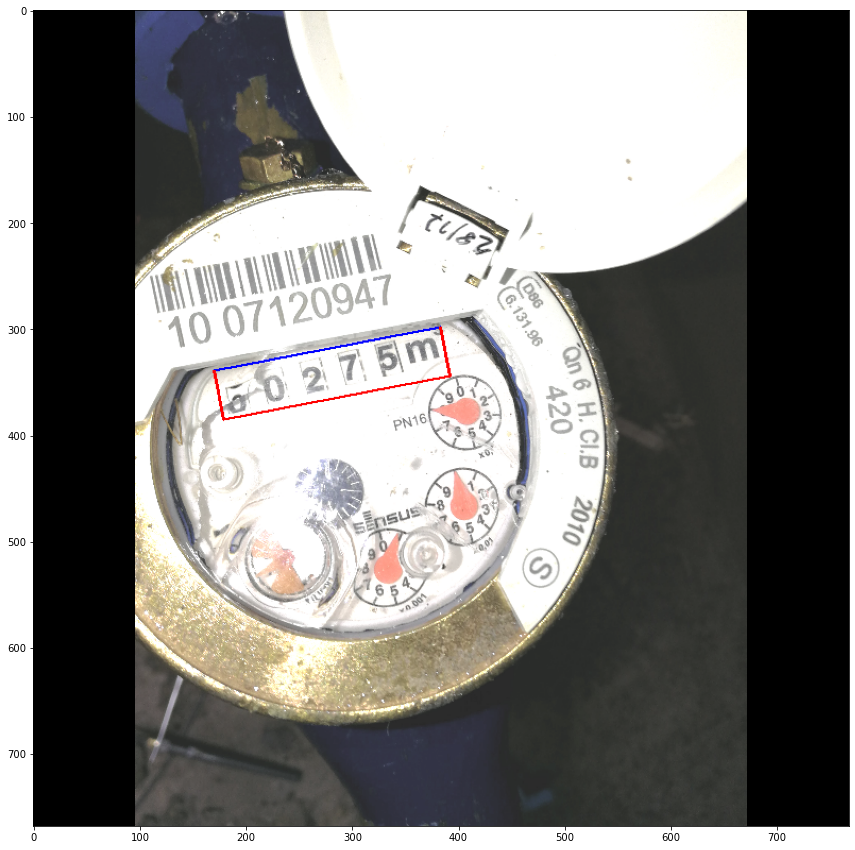

{'bboxes': tensor([[289.6661, 472.5941,  50.9222, 204.5689, -24.6010]]), 'labels': tensor([22])}
-24.600975
[[223.93550853 390.1935209 ]
 [270.2354925  368.99478006]
 [355.39676686 554.99477255]
 [309.09678289 576.1935134 ]]
[289.6661377  472.59414673  50.92224591 204.56891225 155.3990249 ]


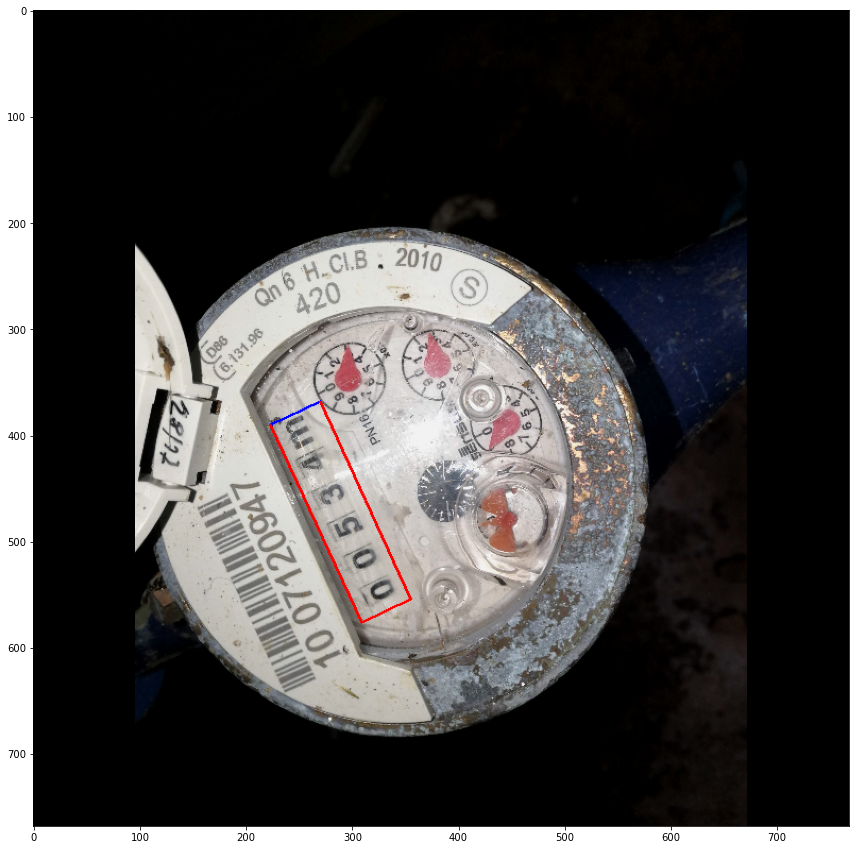

{'bboxes': tensor([[348.7500, 443.5500, 231.2852,  45.2642, -13.0448]]), 'labels': tensor([38])}
-13.044769
[[230.98328216 447.60388965]
 [456.29996573 395.39996111]
 [466.5166568  439.49608594]
 [241.19997323 491.70001447]]
[348.74996948 443.54998779 231.28523094  45.26421325 166.9552307 ]


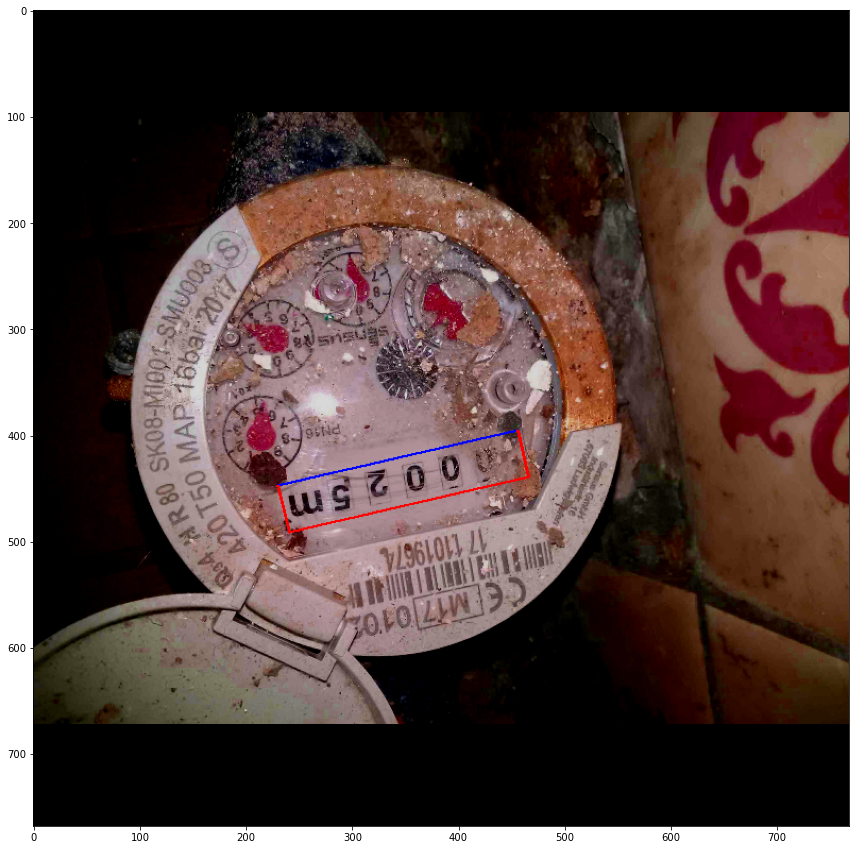

{'bboxes': tensor([[324.5789, 341.9935,  32.6435, 210.2861,  17.1027]]), 'labels': tensor([50])}
17.102715
[[339.89997473 236.6999891 ]
 [371.09999032 246.29998581]
 [309.25786218 447.28707145]
 [278.0578466  437.68707473]]
[324.57891846 341.99353027  32.64354315 210.28613222  17.10271541]


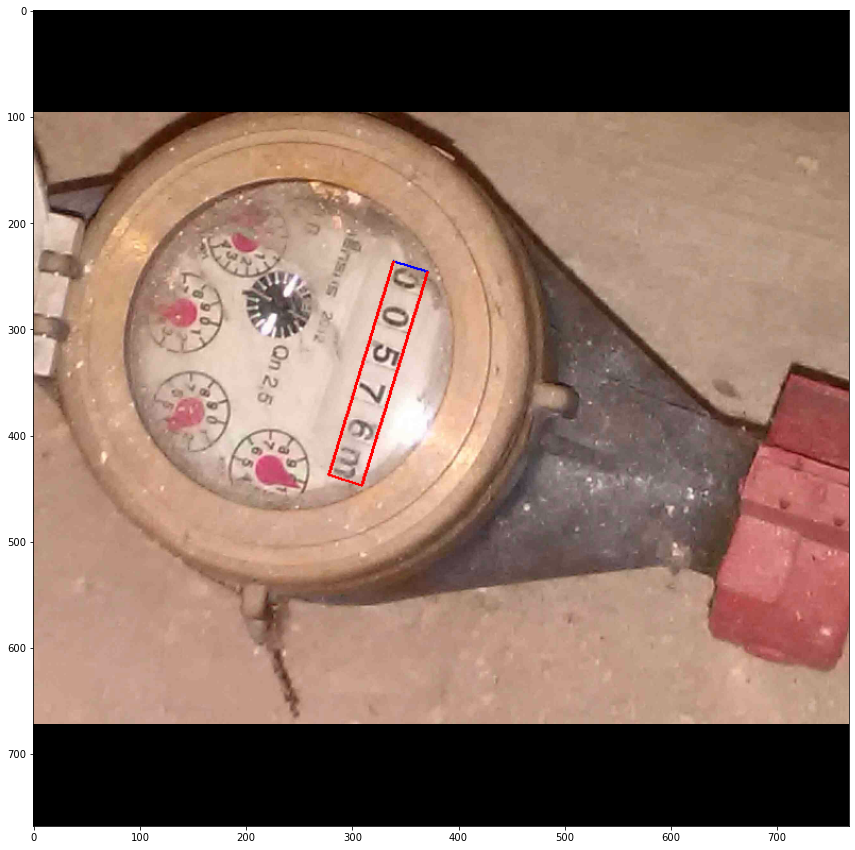

{'bboxes': tensor([[303.7500, 349.9500, 199.3023,  43.8256,  -1.9839]]), 'labels': tensor([0])}
-1.9838562
[[203.39996162 331.50003807]
 [402.58282533 324.6006093 ]
 [404.09997734 368.39998634]
 [204.91711364 375.29941512]]
[303.74996948 349.95001221 199.30232139  43.82564523 178.01614379]


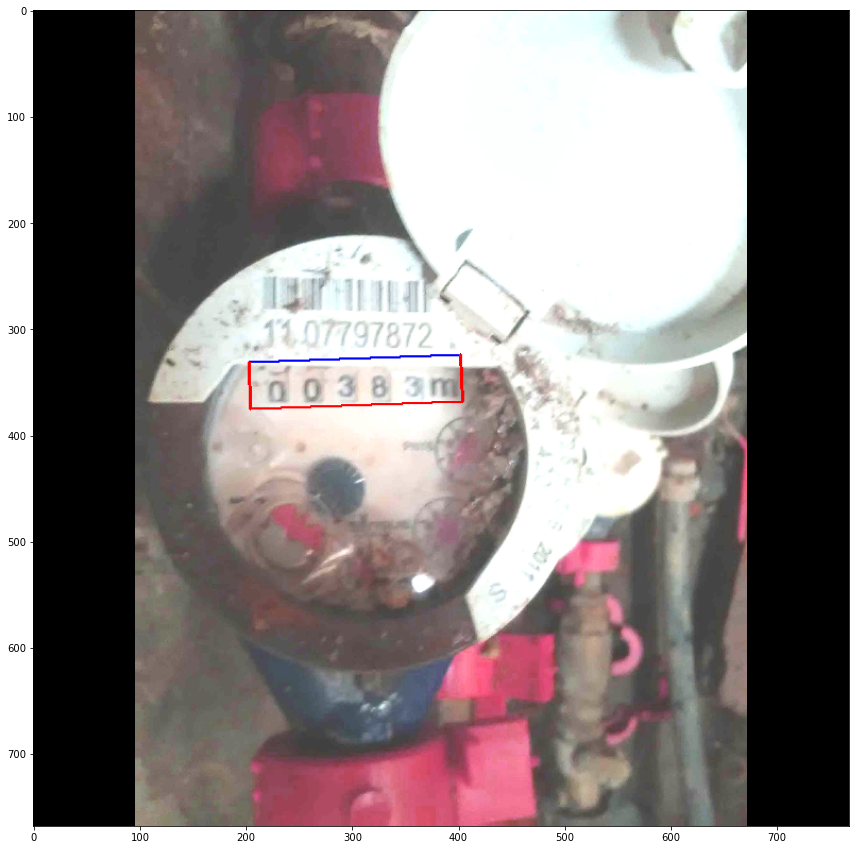

{'bboxes': tensor([[410.4000, 394.8000,  44.1496, 237.2107,  -2.9747]]), 'labels': tensor([54])}
-2.9746704
[[382.20001842 277.49998918]
 [426.29010457 275.20887038]
 [438.6000304  512.0999864 ]
 [394.50994426 514.39110521]]
[410.40002441 394.79998779  44.14957442 237.2107399  177.02532967]


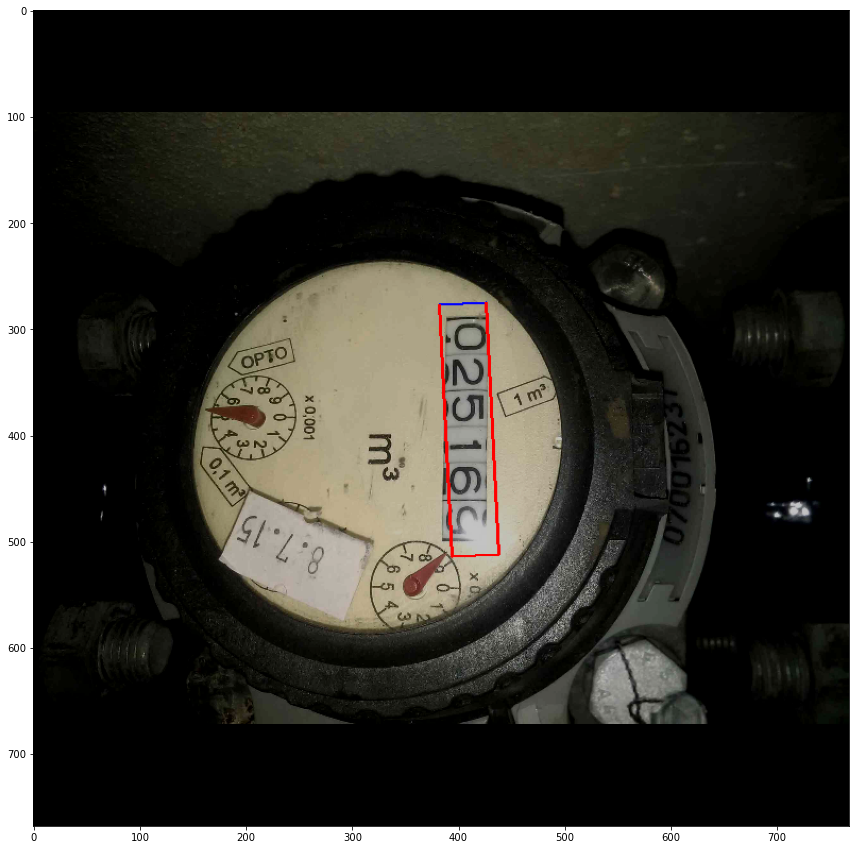

{'bboxes': tensor([[454.2000, 445.9500, 131.4686,  21.8333,  13.2105]]), 'labels': tensor([33])}
13.2105255
[[392.70000299 420.30002048]
 [520.68957244 450.34450745]
 [515.70002142 471.60000393]
 [387.71045197 441.55551696]]
[454.20001221 445.95001221 131.46863157  21.83327163  13.2105245 ]


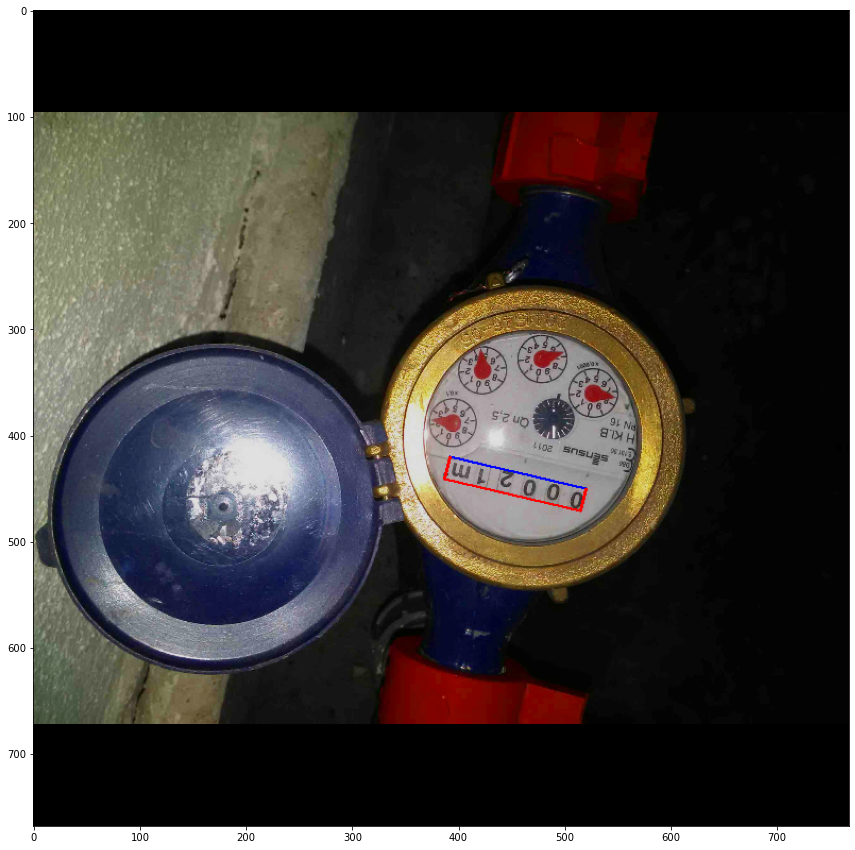

{'bboxes': tensor([[291.6486, 411.3143, 305.0888,  74.5013,  -8.0265]]), 'labels': tensor([1])}
-8.026535
[[135.3972489  395.72862422]
 [437.4972525  353.1285545 ]
 [447.89999231 426.89997686]
 [145.79998871 469.50004658]]
[291.64862061 411.31430054 305.08880365  74.5012735  171.97346485]


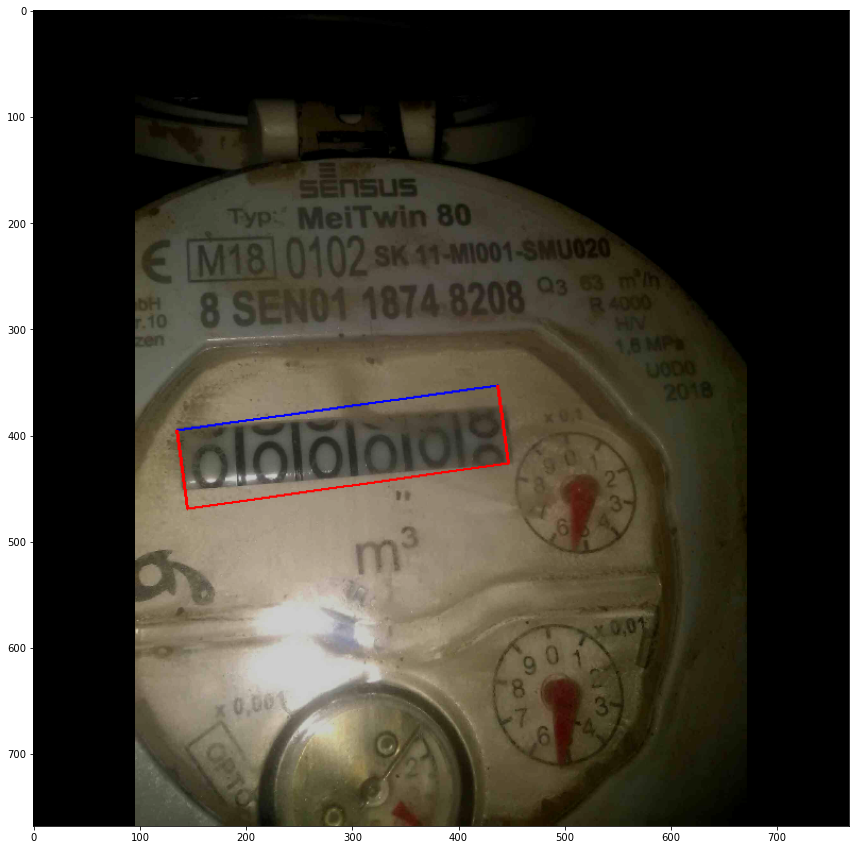

{'bboxes': tensor([[363.1942, 451.8882,   9.3241,  52.8471,   3.3664]]), 'labels': tensor([53])}
3.3664322
[[360.09185302 425.23646122]
 [369.39983801 425.78398513]
 [366.29657472 478.53990597]
 [356.98858973 477.99238206]]
[363.19421387 451.88818359   9.32407459  52.8471137    3.36643234]


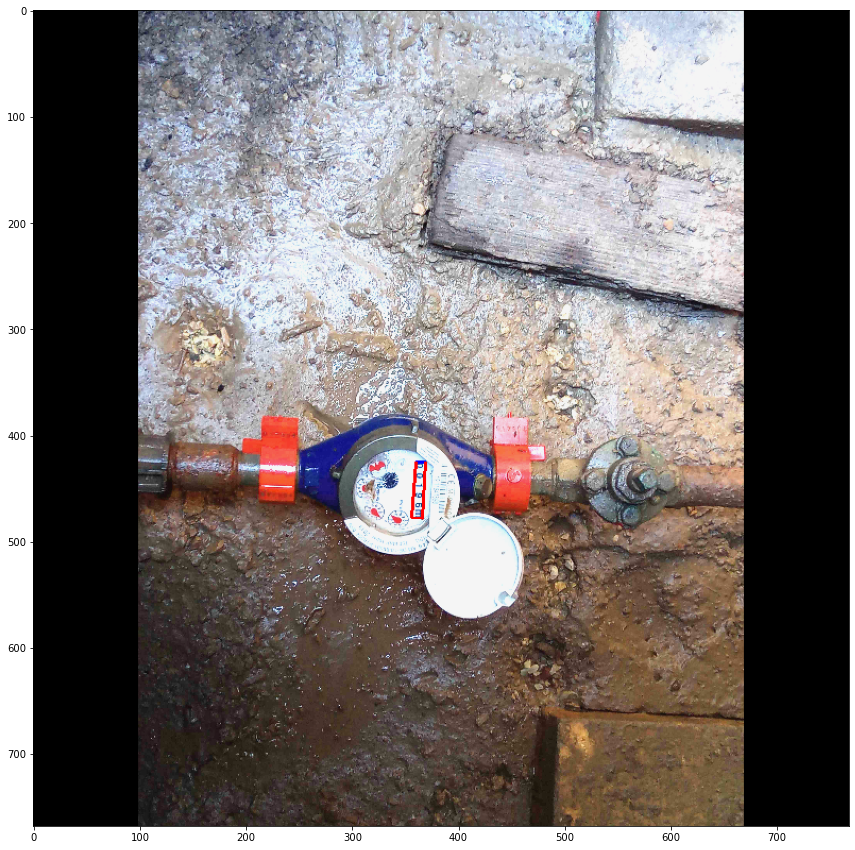

{'bboxes': tensor([[377.1107, 370.5625,  40.5218, 177.7175,   6.9810]]), 'labels': tensor([16])}
6.981041
[[367.79997189 279.89998745]
 [408.02140727 284.82504934]
 [386.42146366 461.22501255]
 [346.20002828 456.29995066]]
[377.11071777 370.5625      40.52184718 177.71748531   6.9810408 ]


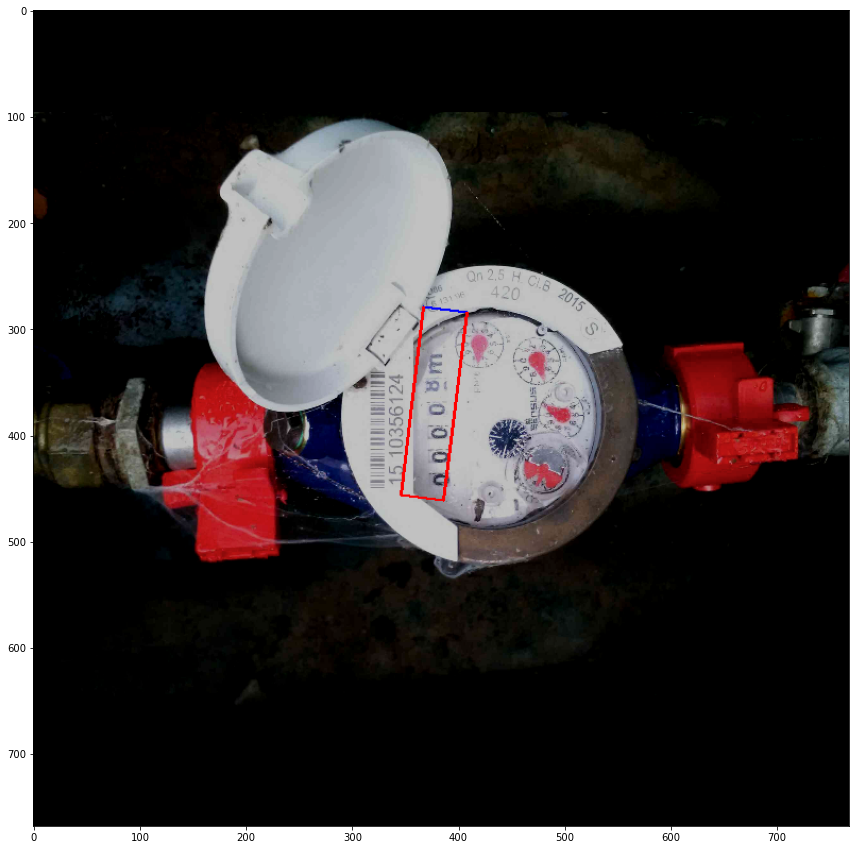

{'bboxes': tensor([[296.1124, 408.8233,  63.1856,  11.3162,   3.6296]]), 'labels': tensor([35])}
3.6295776
[[264.94119598 401.1765405 ]
 [328.00003476 405.17654855]
 [327.28365753 416.47000491]
 [264.22481875 412.46999686]]
[296.11242676 408.82327271  63.18557757  11.31615451   3.62957726]


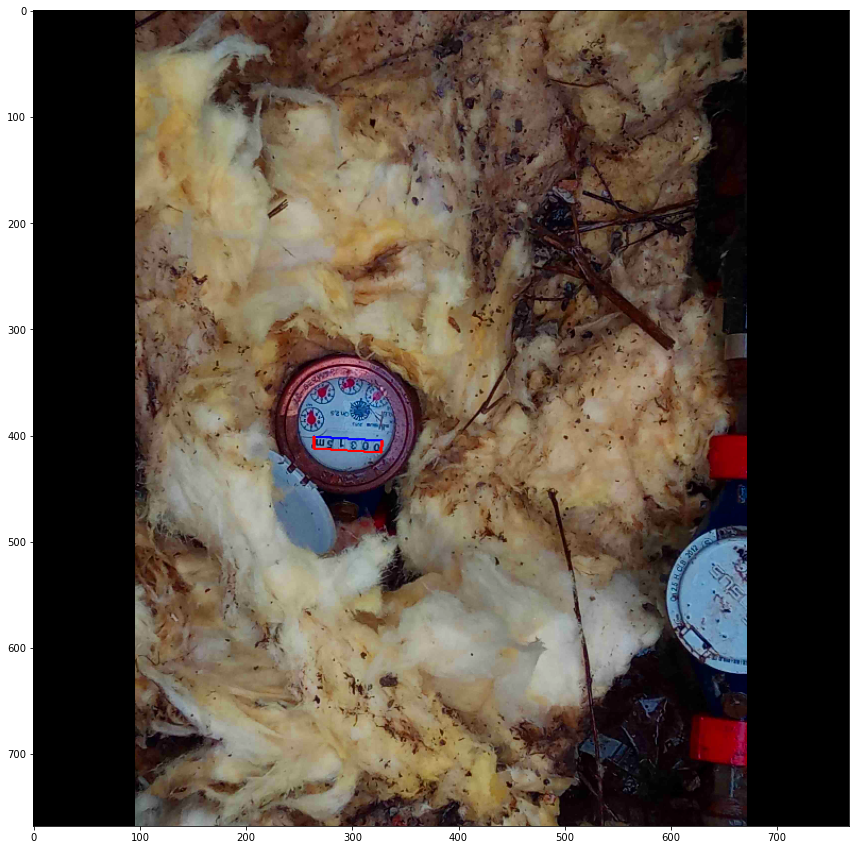

{'bboxes': tensor([[387.0000, 295.3549, 112.2199,  22.6988, -11.4457]]), 'labels': tensor([2])}
-11.445663
[[329.75376118 295.36551523]
 [439.7419753  273.09676489]
 [444.24629985 295.34420156]
 [334.25808573 317.61295191]]
[387.00003052 295.3548584  112.21989346  22.6988409  168.55433683]


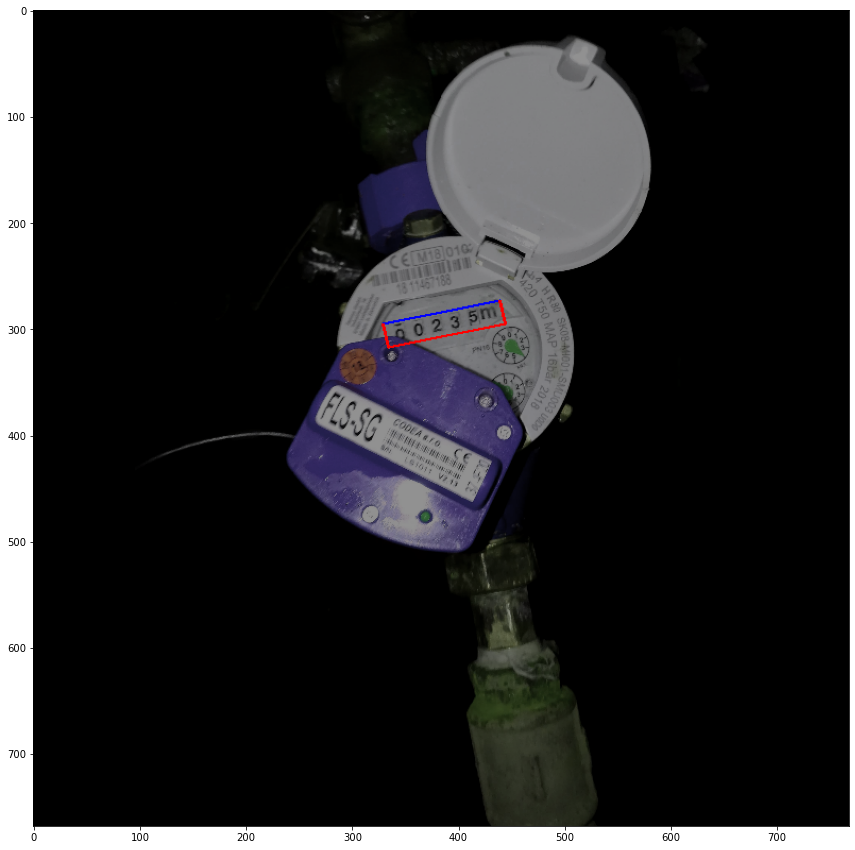

{'bboxes': tensor([[410.9038, 416.4825,  52.2611, 222.5891,  -0.4982]]), 'labels': tensor([18])}
-0.4982071
[[383.80646679 305.41936752]
 [436.06562316 304.96494424]
 [438.00108937 527.5455983 ]
 [385.74193299 528.00002158]]
[410.90377808 416.48248291  52.26113207 222.58906889 179.50179295]


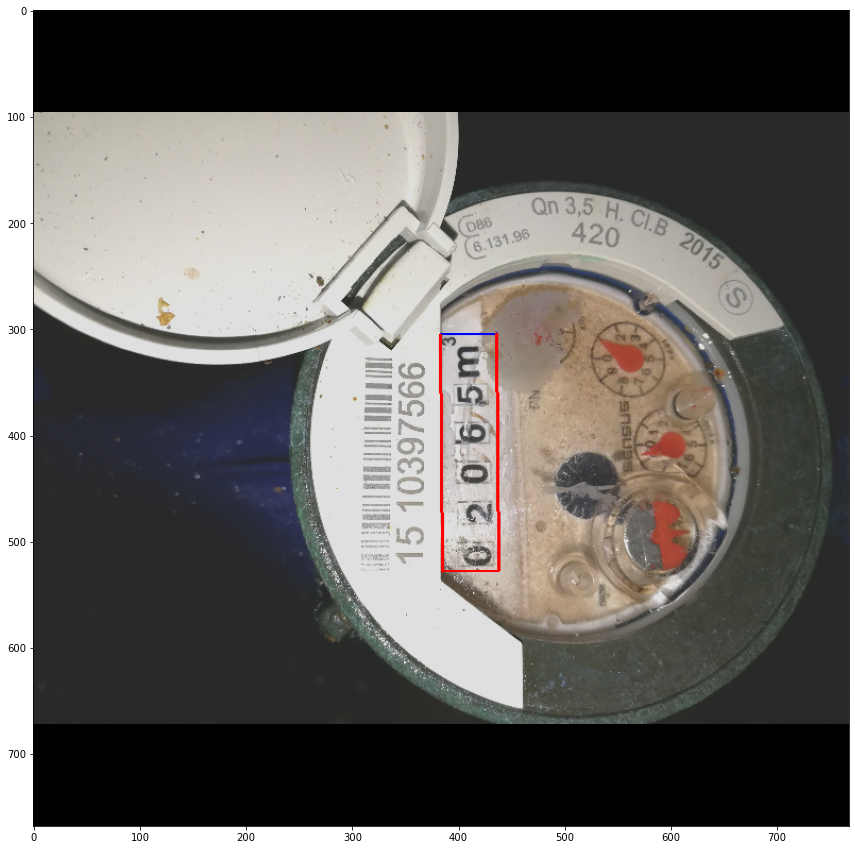

{'bboxes': tensor([[353.5201, 420.2400,  68.8340, 259.8948,  15.9890]]), 'labels': tensor([14])}
15.989029
[[356.22894249 285.83941808]
 [422.40003095 304.79996198]
 [350.8111576  554.64056238]
 [284.64006915 535.68001849]]
[353.52005005 420.23999023  68.83396816 259.89477178  15.98902988]


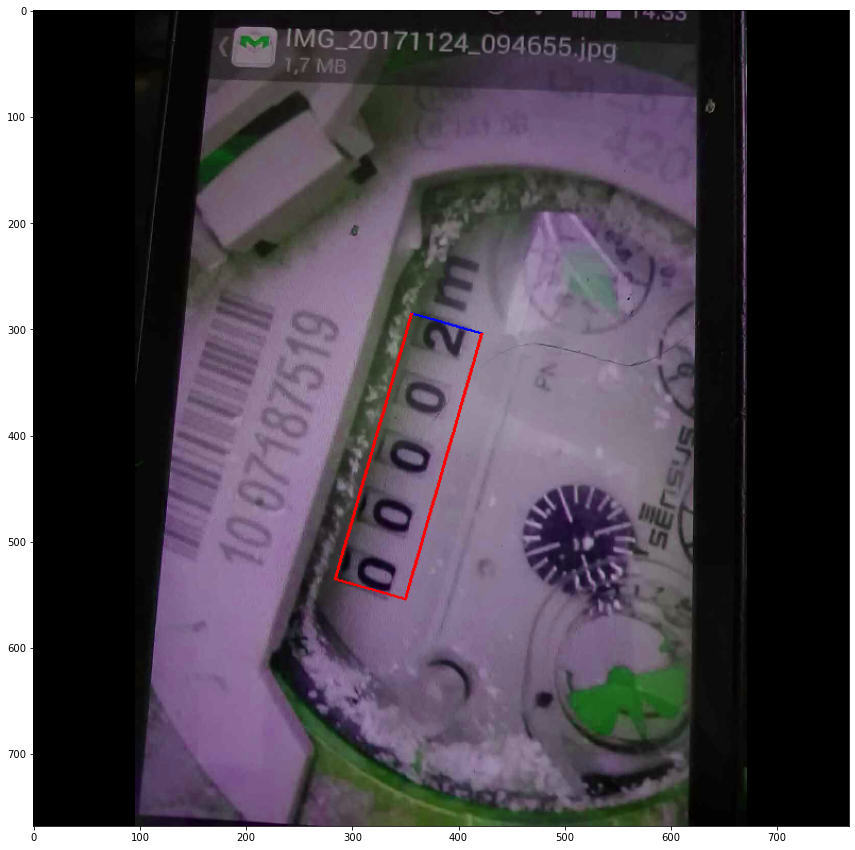

{'bboxes': tensor([[474.0001, 352.9500,  40.4854, 167.8695,  -6.9852]]), 'labels': tensor([55])}
-6.985214
[[443.70005042 272.10005311]
 [483.88492053 267.17649776]
 [504.30007165 433.80003233]
 [464.11520154 438.72358769]]
[474.00006104 352.95004272  40.48536999 167.86953467 173.01478597]


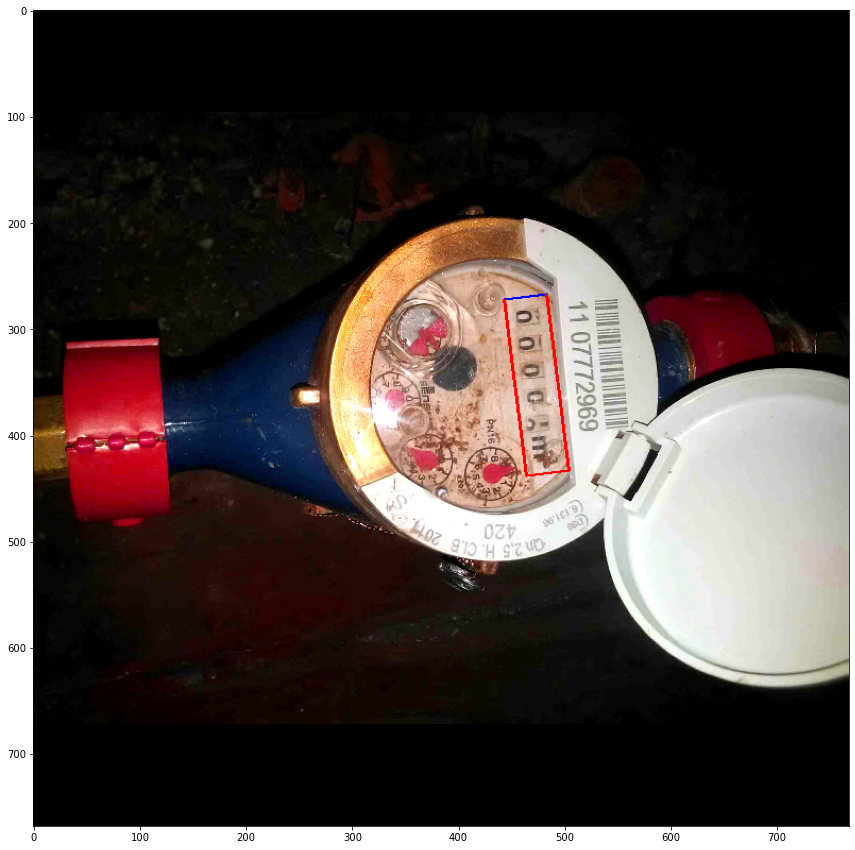

{'bboxes': tensor([[444.4839, 280.8387, 206.8873,  45.3401,   3.4239]]), 'labels': tensor([71])}
3.4239197
[[342.57881386 252.03113263]
 [549.09681036 264.38708532]
 [546.38895958 309.64623553]
 [339.87096308 297.29028285]]
[444.48388672 280.83868408 206.88729406  45.34008309   3.42391966]


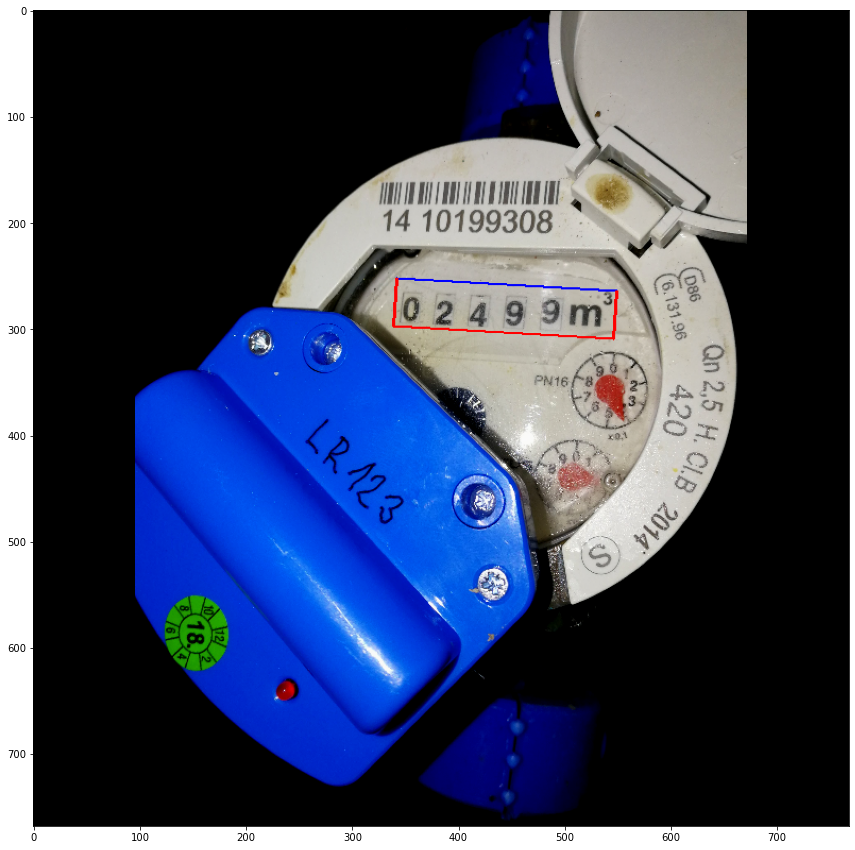

IndexError: list index out of range

In [9]:
for i in range(100):

    target = targets[i]
    info = infos[i]
    print(target)
    bb = target['bboxes'][0].cpu().numpy()
    angle = bb[-1]
    print(angle)
    xy4 = xywha2xy4(bb)
    print(xy4)
    print(xy42xywha(xy4))
    shape =  info['shape'] if False else (768, 768, 3)
    img = images[i].cpu().numpy()
    img = img.transpose(1,2,0)
    img = np.reshape(img/255.0, shape)
    img = Image.fromarray((img*255).astype(np.uint8))
    draw = ImageDraw.Draw(img)
    draw.line((*xy4[0], *xy4[1]), fill='blue', width=3)
    draw.line((*xy4[1], *xy4[2]), fill='red', width=3)
    draw.line((*xy4[2], *xy4[3]), fill='red', width=3)
    draw.line((*xy4[3], *xy4[0]), fill='red', width=3)
    plt.figure(figsize=(15,15))
    plt.imshow(img)
    plt.show()
    



In [ ]:
def get_target(angles):
    sigma = 5
    mid = 180
    gaussian = [(1 / (sigma * np.sqrt(2 * np.pi))) * (1 / (np.exp((i ** 2) / (2 * sigma ** 2)))) for i in
              range(-mid, mid)]
    gaussian = np.roll(gaussian, -180)
    return np.array([np.roll(gaussian, shift=s%360) for s in angles])

p = get_target([45, 360])
plt.bar(np.arange(len(p[0])), p[0])
plt.show()
plt.bar(np.arange(len(p[1])), p[1])
